In [2]:
import pandas as pd
import math
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from dask import bag, diagnostics

import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('data/train.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105392 entries, 0 to 105391
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   filename  105392 non-null  object
 1   category  105392 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 1.6+ MB


In [8]:
n_categories = df['category'].nunique()
print('Number of categories:', n_categories)

Number of categories: 42


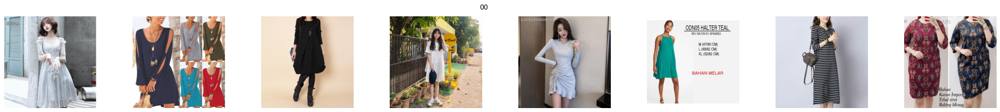

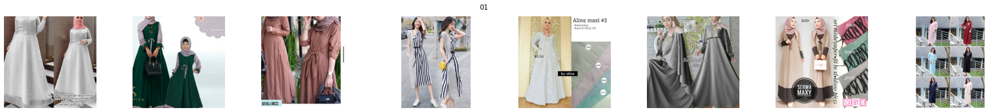

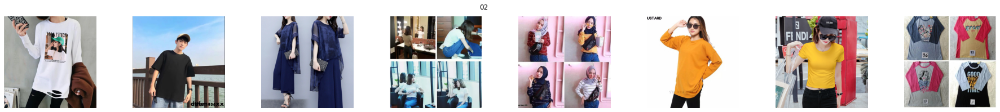

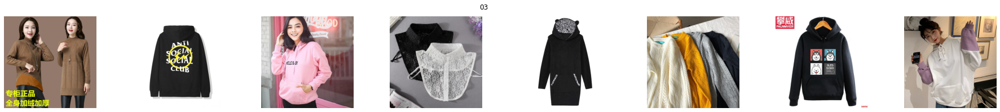

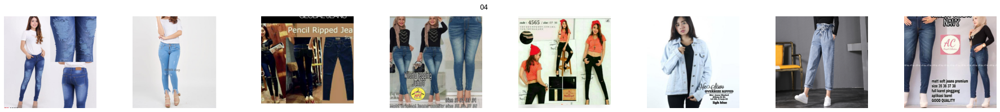

...

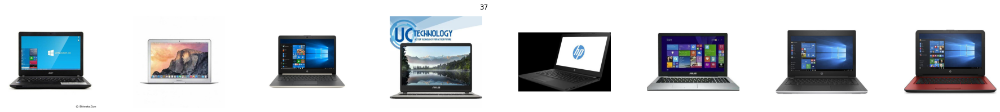

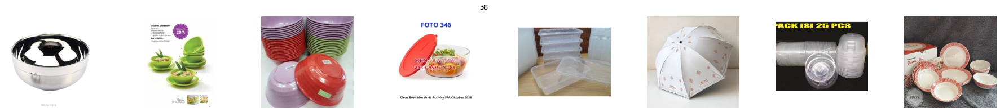

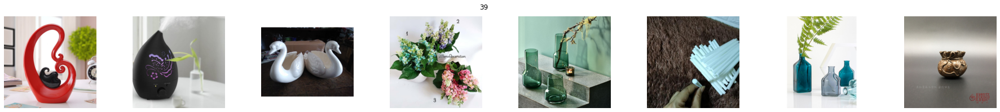

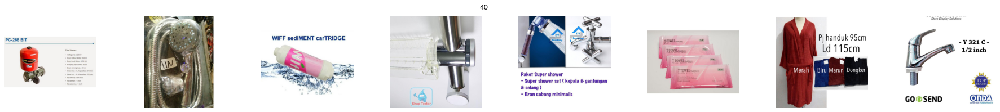

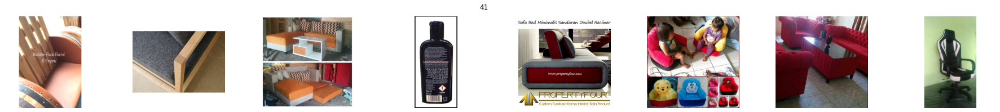

In [62]:
def displayImages(category, n_images):
    selected_df = df.loc[df['category'] == category]
    indices = selected_df.index.to_list()
    n_cols = 8
    n_rows = math.ceil(n_images/n_cols)
    fig = plt.figure(figsize=([n_cols*4, n_rows*3]))
    fig.suptitle(f'{category:02d}')
    for n in range(n_images):
        file_name = selected_df.loc[indices[n], 'filename']
        img_path = f'data/train/{category:02d}/{file_name}'
        image = mpimg.imread(img_path)
        plt.subplot(n_rows, n_cols, n+1)
        plt.axis('off')
        plt.imshow(image)

for category in range(n_categories):
    displayImages(category, 8)

In [63]:
category_count_df = df.groupby('category').count().reset_index().rename({'filename': 'count'}, axis=1)

In [64]:
fig = px.bar(data_frame=category_count_df, x='category', y='count', color='count', color_continuous_scale=px.colors.sequential.Sunset, template='plotly_dark')
fig.update_layout(title_text='Category Distribution Bar Chart')
fig.show()

In [65]:
fig = go.Figure(data=[go.Pie(labels=category_count_df['category'], values=category_count_df['count'], hole=.35)])
fig.update_layout(
    width=1200,
    height=650, 
    template='plotly_dark',
    title_text='Category Distribution Donut Chart',
    annotations=[{'text': f"Total: {sum(category_count_df['count']):,}", 'x': 0.5, 'y': 0.5, 'font_size': 14, 'showarrow': False}]
)
fig.show()

In [9]:
avg = 105393/n_categories
pct = 100/n_categories 
print('Average number of instances:', int(avg))
print('Average distribution percentage:', f'{pct:.2f}%')

Average number of instances: 2509
Average distribution percentage: 2.38%


* Ideally, each category should have a roughly balanced number of instances.
* Since there are 42 categories and 105392 instances, each category should have about <font color='cyan'>2509 instances</font>, or make up about <font color='cyan'>2.38%</font> of the dataset.
* Categories that do not meet the threshold are: <font color='yellow'><i>11, 17, 18, 29, 32, 33, 37</i></font>. These categories require resampling.

In [67]:
def get_dims(img_path):
    img = mpimg.imread(img_path)
    h,w,d = img.shape
    return h,w

dim_df = pd.DataFrame(columns=['height', 'width'])
for category in range(n_categories):
    category_df = df.loc[df['category'] == category]
    img_path = 'data/train/{}/{}'
    sequence = [img_path.format(f'{category:02d}', file_name) for file_name in category_df['filename'].to_list()]
    dim_bag = bag.from_sequence(sequence).map(get_dims)
    print(f'{category:02d}')
    with diagnostics.ProgressBar():
        dims = dim_bag.compute()
        dim_df = pd.concat([dim_df, pd.DataFrame(dims, columns=['height', 'width'])])

dim_grouped_df = dim_df.groupby(['height', 'width']).size().reset_index().rename(columns={0:'count'})
dim_grouped_df.to_csv('output/img_dims.csv')

00
[########################################] | 100% Completed | 20.5s
01
[########################################] | 100% Completed | 12.5s
02
[########################################] | 100% Completed | 12.7s
03
[########################################] | 100% Completed | 11.8s
04
[########################################] | 100% Completed | 11.8s
05
[########################################] | 100% Completed |  9.3s
06
[########################################] | 100% Completed | 11.1s
07
[########################################] | 100% Completed | 11.1s
08
[########################################] | 100% Completed | 13.8s
09
[########################################] | 100% Completed | 12.3s
10
[########################################] | 100% Completed | 13.5s
11
[########################################] | 100% Completed |  8.6s
12
[########################################] | 100% Completed | 15.3s
13
[########################################] | 100% Completed | 11.7s
14
[##

In [68]:
# for category in range(n_categories):
#     category_df = df.loc[df['category'] == category]
#     img_path = 'data/train/{}/{}'
#     img_path_list = [img_path.format(f'{category:02d}', file_name) for file_name in category_df['filename'].to_list()]
#     dim_df = pd.DataFrame(columns=['height', 'width'])
#     for img_path in img_path_list:
#         img = mpimg.imread(img_path)
#         h,w,d = img.shape
#         dim_df = dim_df.append({'height': h, 'width': w}, ignore_index=True)
# dim_grouped_df = dim_df.groupby(['height', 'width']).size().reset_index().rename(columns={0:'count'})
# dim_grouped_df.head()

In [69]:
fig = px.scatter(data_frame=dim_grouped_df, x='width', y='height')
fig.update_layout(
    width=600,
    height=600, 
    template='plotly_dark',
    title_text='Image Dimension Scatter Plot'
)
fig.show()

In [70]:
x = dim_grouped_df['width']
y = dim_grouped_df['height']

fig = go.Figure()
fig.add_trace(go.Histogram2dContour(
        x = x,
        y = y,
        colorscale = 'inferno',
        xaxis = 'x',
        yaxis = 'y'
    ))
fig.add_trace(go.Histogram(
        y = y,
        xaxis = 'x2',
        marker = dict(
            color = 'midnightblue'
        )
    ))
fig.add_trace(go.Histogram(
        x = x,
        yaxis = 'y2',
        marker = dict(
            color = 'midnightblue'
        )
    ))
fig.update_layout(
    autosize = False,
    xaxis = dict(
        zeroline = False,
        domain = [0,0.85],
        showgrid = False
    ),
    yaxis = dict(
        zeroline = False,
        domain = [0,0.85],
        showgrid = False
    ),
    xaxis2 = dict(
        zeroline = False,
        domain = [0.85,1],
        showgrid = False
    ),
    yaxis2 = dict(
        zeroline = False,
        domain = [0.85,1],
        showgrid = False
    ),
    template='plotly_dark',
    height = 600,
    width = 600,
    bargap = 0,
    # hovermode = 'closest',
    showlegend = False,
    title_text='Image Dimension Density Plot',
    yaxis_title='height',
    xaxis_title='width'
)
fig.show()

In [71]:
dim_grouped_df[dim_grouped_df['count']==max(dim_grouped_df['count'])]

,height,width,count
567,700,700,11552


* The dimension of the images ranges from 1x1 to 1024x1024.
* Most images are square-shaped.
* Dimension 700x700 has the highest count of images.